# Visualize University of Maryland Ridge Detection Algorithm data

The University of Maryland Ridge Detection Algorithm (UMD RDA) operates on ICESat-2 data to estimate Surface Elevation, Surface Roughness, Ridge Locations, Sail Height over seaice.  The algorithm was developed by Kyle Duncan and Sinead Farrell, University of Maryland.

The test data set comprises four different test cases - each test case is about 50 km long and covers slightly different sea ice. The data from April 2019 are all over consolidated multiyear ice, of varying roughness, and the data from Sept 2019 are for the unconsolidated ice pack.

1) April 19, 2019, 50 km long  
2) April 22, 2019, 40 km long  
3) April 22, 2019, 50 km long (starts 65 km after end of test case #2)  
4) September 3, 2019, 50 km long  

The test dataset used here includes surface elevation and roughness.

Please include Sinead Farrell and Kyle Duncan, University of Maryland) in __any__ type of presentation where these data are used or referenced.

Please cite the following two publications. These should be referenced if the data are published anywhere on the web, in a manuscript, OR in any other article:

Farrell, S. L., Duncan, K., Buckley, E. M., Richter-Menge, J., and Li, R. (2020) Mapping Sea Ice Surface Topography in High Fidelity with ICESat-2. Geophysical Research Letters, 47, e2020GL090708. https://doi.org/doi:10.1029/2020GL090708
    
Duncan, K. and S.L. Farrell (2020). High-Resolution Sea Ice Topography from ICESat-2, presented at the AGU 2020 Fall Meeting, San Francisco, California, 1-17 Dec. 2020. https://doi.org/doi:10.1002/essoar.10505000.1

In [2]:
from pathlib import Path
import re
import warnings 
import pprint 
import datetime as dt

import pandas as pd

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import hvplot.pandas

DATAPATH = Path('/', 'media', 'apbarret', 'andypbarrett_work', 'Data', 'ICESat-2', 'RDA')

## Read files
Files are named in the following convention:

UMD-RDA.hhh.Product_Name.vNN.YYYYMMDD_HHMMSS_ttttccss_VVV_rr_bbbb.xxx

UMD-RDA = University of Maryland-Ridge Detection Algorithm

hhh = Polar environment in which data was collected
	Arc = Arctic
	Ant = Antarctic

Product_Name = Name of product included in file
	For example, "Surface_Elevation" or "Surface_Roughness"

vNN = UMD Product version number such as "v01"

YYYYMMDD = Year, month, and day of data acquisition

HHMMSS = Data acquisition start time, hour, minute, and second (UTC)

tttt = Four digit ICESat-2 Reference Ground Track number

cc = ICESat-2 cycle number

ss = ICESat-2 ATL03 segment number

VVV = ICESat-2 ATL03 product version/release number

rr = Revision number for product version/release number given in "VVV"

bbbb = ICESat-2 beam name

xxx = File type, such as, ".txt" or ".h5"

Data are in comma delimited files with 28 line headers.  Columns are:
1.  Longitude (degrees)  
2.  Latitude (degrees)  
3.  Time (Elapsed GPS seconds)  
4.  Surface Elevation (meters, relative to DTU18 mean sea surface)  

In [3]:
surface_elevation_files = list((DATAPATH / 'SurfaceElevation').glob('*.txt'))
surface_roughness_files = list((DATAPATH / 'SurfaceRoughness').glob('*.txt'))

In [90]:
def parse_granule_id(gid):
    parts = gid.split('_')
    granule_meta = {
        'datetime': dt.datetime.strptime(''.join(parts[:2]), '%Y%m%d%H%M%S'),
        'rgt': parts[2][:4],
        'cycle': parts[2][4:6],
        'segment': parts[2][6:],
        'release': parts[3],
        'revision': parts[4],
        'beam': parts[5],
    }
    return granule_meta


def parse_filename(fn):
    '''Parses filename into dictionary'''
    is2_granule_id_pattern = re.compile('\d{8}_\d{6}_\d{8}_\d{3}_\d{2}_gt\d[lr]')
    parts = fn.stem.split('.')
    if is2_granule_id_pattern.match(parts[-1]):
        granule_id = parse_granule_id(parts[-1])
        subsection = 'A'
    else:
        granule_id = parse_granule_id(parts[-2])
        subsection = parts[-1]

    metadata = {
        'filepath': fn,
        'algorithm': parts[0],
        'region': parts[1],
        'product': parts[2],
        'umd_version': parts[3],
        'subsection': subsection,
    }
    return {**metadata, **granule_id}


def read_umd_rda(fn):
    '''Reads University of Maryland RDA data'''
    df = pd.read_csv(fn, skiprows=28, header=0)
    df.columns = [col.strip() for col in df.columns]
    return df


def data_column_name_from_product(product):
    return ' '.join(product.split('_'))


def guess_data_column(df):
    '''Guesses name of data product column'''
    return [col for col in df.columns if col not in ['Longitude', 'Latitude', 'Time']][0]


def get_data_column_name(product, df):
    '''Tries to find name of data column
    First tries to get from product, otherwise uses non-coordinate column in dataframe'''
    data_column = data_column_name_from_product(product)
    if data_column in df.columns:
        return data_column
    else:
        data_column_guess = guess_data_column(df)
        warnings.warn('{data_column} not found in DataFrame, using {data_column_guess} instead')
        return data_column_guess


class UMD_RDA():
    
    def __init__(self, filepath):
        
        metadata = parse_filename(filepath)
        
        self.filepath = metadata['filepath']
        self.algorithm = metadata['algorithm']
        self.region = metadata['region']
        self.product = metadata['product']
        self.rda_version = metadata['umd_version']
        self.subsection = metadata['subsection']
        self.datetime = metadata['datetime']
        self.rgt = metadata['rgt']
        self.cycle = metadata['cycle']
        self.segment = metadata['segment']
        self.release = metadata['release']
        self.revision = metadata['revision']
        self.beam = metadata['beam']
        
        self.data = read_umd_rda(filepath)
        
        self.npoints = self.data.shape[0]
        
        self.data_column = get_data_column_name(self.product, self.data)
        
    
    def metadata(self):
        '''Prints metadata'''
        print(f'Filename: {self.filepath.name}')
        print(f'Algorithm: {self.algorithm}')
        print(f'Region: {self.region}')
        print(f'Product: {self.product}')
        print(f'RDA version: {self.rda_version}')
        print(f'Date: {self.datetime.strftime("%Y-%m-%d %H:%M:%S")}')
        print(f'RGT: {self.rgt}')
        print(f'Cycle: {self.cycle}')
        print(f'Segment: {self.segment}')
        print(f'Release: {self.release}')
        print(f'Revision: {self.revision}')
        print(f'Subsection: {self.subsection}')
        print(f'Beam: {self.beam}')
        print(f'Points: {self.npoints}')

        
    def datestr(self, format='%Y-%m-%d %H:%M:%S'):
        '''Return formatted datestring'''
        return self.datetime.strftime(format)
    
    
    def granule_id(self):
        '''Return a unique identifier for data'''
        return f'{self.datestr()} {self.rgt}-{self.cycle}-{self.segment}-{self.beam}-{self.subsection}'
    
    
    def plot_profile(self, kind='mpl'):
        '''Plot a surface elevation or roughness profile
        
        kind - either mpl for standard plot or hvplot for interactive plot
        '''
        raise NotImplementedError(
        if kind == 'mpl':
            self.data[self.data_column].plot()
        elif kind == 'hvplot':
            self.data[self.data_column].hvplot()
        else:
            raise SyntaxError("Unknown option for kind.  Expects either 'mpl' or 'hvplot'")
        

In [91]:
surface_elevation = {}
for se_file in surface_elevation_files:
    md = UMD_RDA(se_file)
    surface_elevation[md.granule_id()] = md

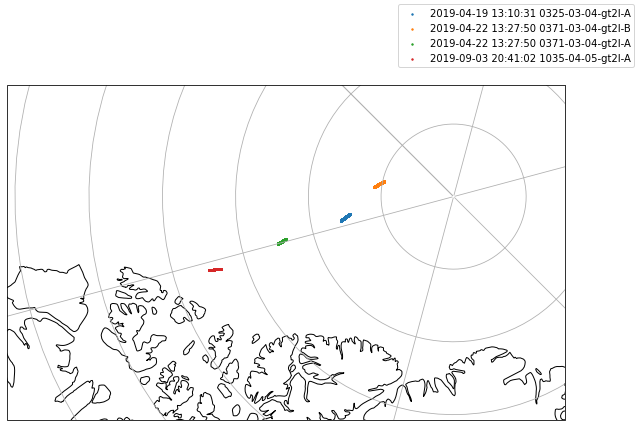

In [65]:
NSIDCNorthPolarStereo = ccrs.Stereographic(central_latitude=90., central_longitude=-45., true_scale_latitude=70.)

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(projection=NSIDCNorthPolarStereo)
ax.set_extent([-2000000, 500000, -1000000, 500000], NSIDCNorthPolarStereo)
ax.coastlines()
ax.gridlines()

for name, obj in surface_elevation.items():
    ax.scatter(x=obj.data.Longitude, y=obj.data.Latitude, s=2,
               transform=ccrs.PlateCarree(),
               label=name)

fig.legend()

In [66]:
for key in surface_elevation.keys():
    print(key)

2019-04-19 13:10:31 0325-03-04-gt2l-A
2019-04-22 13:27:50 0371-03-04-gt2l-B
2019-04-22 13:27:50 0371-03-04-gt2l-A
2019-09-03 20:41:02 1035-04-05-gt2l-A


In [94]:
surface_elevation['2019-04-19 13:10:31 0325-03-04-gt2l-A'].data['Surface Elevation'].hvplot()

:Curve   [index]   (Surface Elevation)

In [95]:
surface_elevation['2019-04-22 13:27:50 0371-03-04-gt2l-B'].data['Surface Elevation'].hvplot()

:Curve   [index]   (Surface Elevation)

In [96]:
surface_elevation['2019-04-22 13:27:50 0371-03-04-gt2l-A'].data['Surface Elevation'].hvplot()

:Curve   [index]   (Surface Elevation)

In [97]:
surface_elevation['2019-09-03 20:41:02 1035-04-05-gt2l-A'].data['Surface Elevation'].hvplot()

:Curve   [index]   (Surface Elevation)